In [30]:
%matplotlib inline

import os

import IPython.display as ipd
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import sklearn as skl
import sklearn.utils, sklearn.preprocessing, sklearn.decomposition, sklearn.svm
import librosa
import librosa.display
import utils

import warnings 
warnings.filterwarnings('always')   #suppresses all warnings
warnings.filterwarnings('ignore')

In [31]:
tracks= utils.load("/Users/david/Desktop/DM2 project/fma_metadata/tracks.csv")
tracks_cut=['album','artist']
tracks.drop(tracks_cut,axis=1,inplace=True)
tracks=tracks.droplevel(0,axis=1)
tracks.drop(index=tracks[tracks.subset=='large'].index, inplace=True)
tracks_cut=['composer', 'date_created','date_recorded',
            'license','number','title','language_code',
            'publisher', 'tags','information','lyricist','genres','genres_all',
            'favorites','interest','bit_rate','split','subset']
tracks.drop(tracks_cut,axis=1,inplace=True)
tracks.drop(tracks[tracks['genre_top']=='Spoken'].index, inplace=True)

In [32]:
features= utils.load("/Users/david/Desktop/DM2 project/fma_metadata/features.csv")
feat=features[['spectral_centroid']]
feat=feat.droplevel(0,axis=1)
feat.columns=['kurtosis','max','mean','median','min','skew','std']
#cut=['roll_kurtosis','roll_max','roll_std','roll_median','roll_min','roll_skew']
#feat.drop(cut,axis=1,inplace=True)

In [33]:
#estrazioni da librosa_mp3 di 10  secondi dopo i primi 10 features rolloff
ts=pd.read_csv("/Users/david/Desktop/DM2 project/fma_metadata/ts_centroid.csv")
cut_columns=['Unnamed: 0','Unnamed: 0.1']
ts.drop(cut_columns, axis=1, inplace=True)
ts.shape

(1028, 1207)

In [34]:
ts=ts.set_index(['track_id'])

In [35]:
ts_df=pd.merge(tracks,ts, on='track_id')
ts_df.shape

(1028, 1210)

In [36]:
cut=ts_df.iloc[:,5:]
cut

,1,2,3,4,5,6,7,8,9,10,...,1196,1197,1198,1199,1200,1201,1202,1203,1204,1205
track_id,,,,,,,,,,,,,,,,,,,,,
4850,0.177222,0.170356,0.174893,0.181088,0.179945,0.180785,0.181348,0.175140,0.177304,0.172171,...,0.429477,0.438678,0.423448,0.416010,0.414990,0.434620,0.557168,0.779985,0.852099,0.806474
4851,0.162770,0.188715,0.196280,0.222101,0.236519,0.235485,0.234684,0.237329,0.223463,0.202970,...,0.100511,0.092096,0.077473,0.062344,0.058620,0.039428,0.035532,0.036547,0.003289,0.039476
5009,0.141881,0.181742,0.295769,0.343891,0.415385,0.524990,0.526107,0.438027,0.430539,0.389028,...,0.396982,0.354043,0.370011,0.368628,0.309365,0.282796,0.272292,0.276301,0.301752,0.270572
5012,0.103542,0.167626,0.233723,0.334451,0.458624,0.421045,0.172120,0.230144,0.366459,0.454434,...,0.291008,0.467978,0.473676,0.195546,0.092509,0.263610,0.330493,0.367824,0.399824,0.282295
5013,0.198303,0.286986,0.377489,0.289663,0.278561,0.435295,0.430005,0.354197,0.245915,0.230021,...,0.469473,0.409380,0.320596,0.243092,0.350757,0.478701,0.517602,0.362054,0.187761,0.319275
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
145571,0.142267,0.201845,0.222700,0.233242,0.242973,0.254982,0.262475,0.263909,0.196623,0.134043,...,0.684569,0.636211,0.606933,0.574697,0.627221,0.655860,0.663117,0.688209,0.765299,0.918020
148488,0.432888,0.514998,0.490458,0.413571,0.402621,0.491540,0.525808,0.532001,0.530079,0.513555,...,0.533067,0.665458,0.739708,0.792238,0.852144,0.858632,0.790833,0.733323,0.712553,0.685199
148490,0.315912,0.430291,0.527045,0.610343,0.618256,0.632774,0.603301,0.517525,0.518159,0.528681,...,0.759514,0.767398,0.699457,0.517079,0.291194,0.326616,0.426413,0.417115,0.455782,0.601036


In [37]:
ts_df.drop(cut,axis=1, inplace=True)

In [38]:
ts_df=pd.merge(ts_df,feat, on='track_id')
ts_df

,comments,duration,genre_top,listens,0,kurtosis,max,mean,median,min,skew,std
track_id,,,,,,,,,,,,
4850,0,164,Classical,13221,0.203188,40.157177,5693.858887,531.164001,445.917084,249.851807,5.489871,376.292480
4851,0,236,Classical,9283,0.139737,45.221325,5715.818359,462.206146,386.870026,0.000000,5.831337,378.367340
5009,0,257,Old-Time / Historic,1900,0.097878,29.038763,5579.080566,997.398926,933.559448,0.000000,4.048092,321.319214
5012,0,245,Old-Time / Historic,3032,0.088058,17.429407,5512.500000,1491.275391,1410.062988,0.000000,3.420450,337.361053
5013,0,269,Old-Time / Historic,3946,0.134297,71.632355,5511.795410,999.326538,958.825928,0.000000,6.991871,252.320953
...,...,...,...,...,...,...,...,...,...,...,...,...
145571,0,127,Classical,3242,0.104488,21.598671,7337.872070,573.504334,294.138428,192.901352,4.666363,1112.711792
148488,0,312,Classical,763,0.372093,0.242710,5512.074219,888.161499,819.300232,0.000000,0.578792,429.978790
148490,0,353,Classical,480,0.236911,25.423370,5198.076172,1073.537231,1063.086548,289.355316,2.816643,391.469727


In [39]:
ts_df.shape

(1028, 12)

In [40]:
ts_df['genre_top'].value_counts()

Classical              526
Old-Time / Historic    502
Blues                    0
Country                  0
Easy Listening           0
Electronic               0
Experimental             0
Folk                     0
Hip-Hop                  0
Instrumental             0
International            0
Jazz                     0
Pop                      0
Rock                     0
Soul-RnB                 0
Spoken                   0
Name: genre_top, dtype: int64

# CLUSTERING

In [41]:
from tslearn.preprocessing import TimeSeriesScalerMeanVariance, TimeSeriesScalerMinMax

In [42]:
scaler = TimeSeriesScalerMeanVariance(mu=0., std=1.) #(mu=0., std=1.)  # Rescale time series
ts_scaled= scaler.fit_transform(ts) #.values.reshape(1,-1))

In [43]:
ts_scaled=ts_scaled.squeeze()
ts_scaled.shape

(1028, 1206)

In [44]:
ts= pd.DataFrame(ts_scaled, index =ts.index,columns=ts.columns)

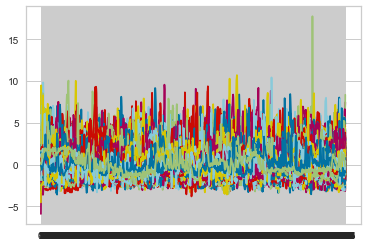

In [45]:
plt.plot(ts.T)
plt.show()

## Shape-based Clustering

# KMeans

In [46]:
#libreries for clustering
from sklearn import metrics
from sklearn import preprocessing
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score
from yellowbrick.cluster import KElbowVisualizer
from tslearn.clustering import TimeSeriesKMeans

### K-MEANS VALIDATION

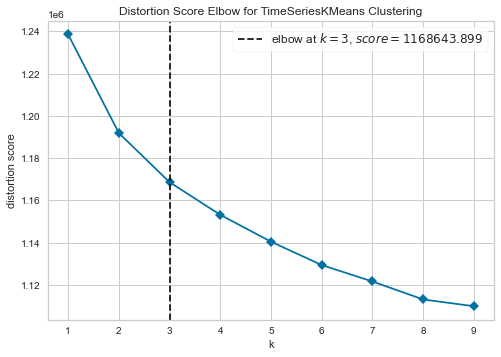

<AxesSubplot:title={'center':'Distortion Score Elbow for TimeSeriesKMeans Clustering'}, xlabel='k', ylabel='distortion score'>

In [26]:
# Instantiate the clustering model and visualizer
model = TimeSeriesKMeans()
visualizer = KElbowVisualizer(model, k=(1,10),timings=False) #timengs = time to compute

visualizer.fit(ts)       # Fit the data to the visualizer
visualizer.show()        # Finalize and render the figure


In [27]:
#calculate silhouette for different values of K
k_to_test = range(2,11,1) # [2,3,4, ..., 24]
silhouette_scores = {}

for k in k_to_test:
    model_kmeans_k = TimeSeriesKMeans( n_clusters = k )
    model_kmeans_k.fit(ts)
    labels_k = model_kmeans_k.labels_
    score_k = metrics.silhouette_score(ts, labels_k)
    silhouette_scores[k] = score_k
    print("Tested kMeans with k = %d\tSS: %5.4f" % (k, score_k))
    
print("Done!")

Tested kMeans with k = 2	SS: 0.0359
Tested kMeans with k = 3	SS: 0.0272
Tested kMeans with k = 4	SS: 0.0232
Tested kMeans with k = 5	SS: 0.0210
Tested kMeans with k = 6	SS: 0.0194
Tested kMeans with k = 7	SS: 0.0182
Tested kMeans with k = 8	SS: 0.0156
Tested kMeans with k = 9	SS: 0.0183
Tested kMeans with k = 10	SS: 0.0164
Done!


In [28]:
#convert dict values to a list 
sil_v = []
for i in silhouette_scores.values():
    sil_v.append(i)

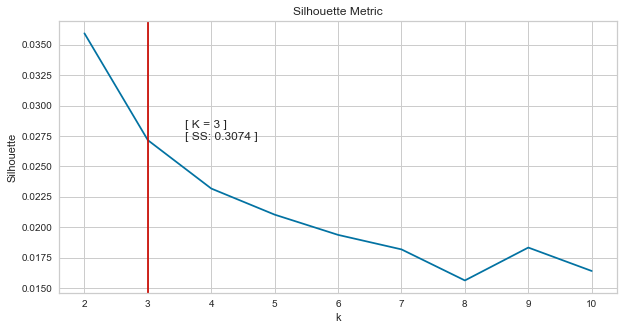

In [29]:
#Silhouette metric graph
plt.figure(figsize = (10,5))
plt.plot(sil_v)
plt.xticks(range(0,9,1), silhouette_scores.keys())
plt.title("Silhouette Metric")
plt.xlabel("k")
plt.ylabel("Silhouette")
plt.axvline(1, color = "r")
plt.figtext(0.3,0.55,'[ K = 3 ]\n[ SS: 0.3074 ] ')
plt.show()


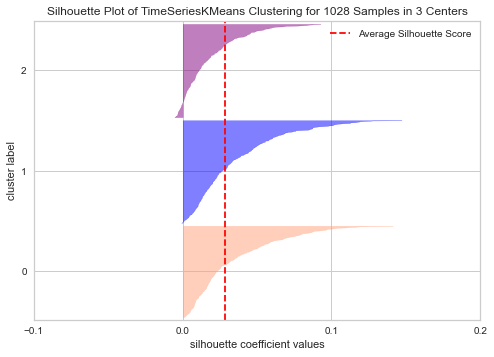

<AxesSubplot:title={'center':'Silhouette Plot of TimeSeriesKMeans Clustering for 1028 Samples in 3 Centers'}, xlabel='silhouette coefficient values', ylabel='cluster label'>

In [30]:
#visualize silhouette for K=3
from yellowbrick.cluster import SilhouetteVisualizer

model = TimeSeriesKMeans(3)
visualizer = SilhouetteVisualizer(model, colors = ['lightsalmon','blue','purple'])

visualizer.fit(ts)        # Fit the data to the visualizer
visualizer.show()        # Finalize and render the figure

In [209]:
km= TimeSeriesKMeans(n_clusters=3,metric='euclidean',n_init=10, max_iter=200, random_state=0)
km.fit(ts)

TimeSeriesKMeans(max_iter=200, n_init=10, random_state=0)

In [210]:
km.cluster_centers_.shape

(3, 1206, 1)

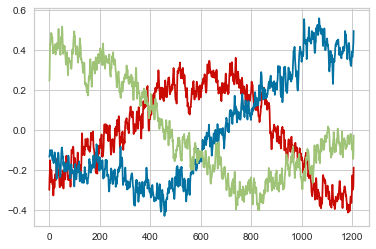

In [211]:
plt.plot(np.squeeze(km.cluster_centers_[0], ).T, color='r')
plt.plot(np.squeeze(km.cluster_centers_[1],).T, color='b')
plt.plot(np.squeeze(km.cluster_centers_[2], ).T, color='g')
plt.show()

In [212]:
ts_df_eu=ts_df.copy()
ts_df_eu['Cluster_eu']=km.labels_

In [213]:
clas_0=ts_df_eu[ts_df_eu['genre_top']=='Classical'][ts_df_eu['Cluster_eu']==0].index
clas_1=ts_df_eu[ts_df_eu['genre_top']=='Classical'][ts_df_eu['Cluster_eu']==1].index
clas_2=ts_df_eu[ts_df_eu['genre_top']=='Classical'][ts_df_eu['Cluster_eu']==2].index
old_0=ts_df_eu[ts_df_eu['genre_top']=='Old-Time / Historic'][ts_df_eu['Cluster_eu']==0].index
old_1=ts_df_eu[ts_df_eu['genre_top']=='Old-Time / Historic'][ts_df_eu['Cluster_eu']==1].index
old_2=ts_df_eu[ts_df_eu['genre_top']=='Old-Time / Historic'][ts_df_eu['Cluster_eu']==2].index

In [214]:
print('Cluster 0: Classical:{}, Old-Time/Historic:{}, Total of:{}'.format(len(clas_0),len(old_0),len(clas_0)+len(old_0)))
print('Cluster 1: Classical:{}, Old-Time/Historic:{}, Total of {}'.format(len(clas_1),len(old_1),len(clas_1)+len(old_1)))
print('Cluster 2: Classical:{}, Old-Time/Historic:{}, Total of {}'.format(len(clas_2),len(old_2),len(clas_2)+len(old_2)))

Cluster 0: Classical:170, Old-Time/Historic:178, Total of:348
Cluster 1: Classical:207, Old-Time/Historic:134, Total of 341
Cluster 2: Classical:149, Old-Time/Historic:190, Total of 339


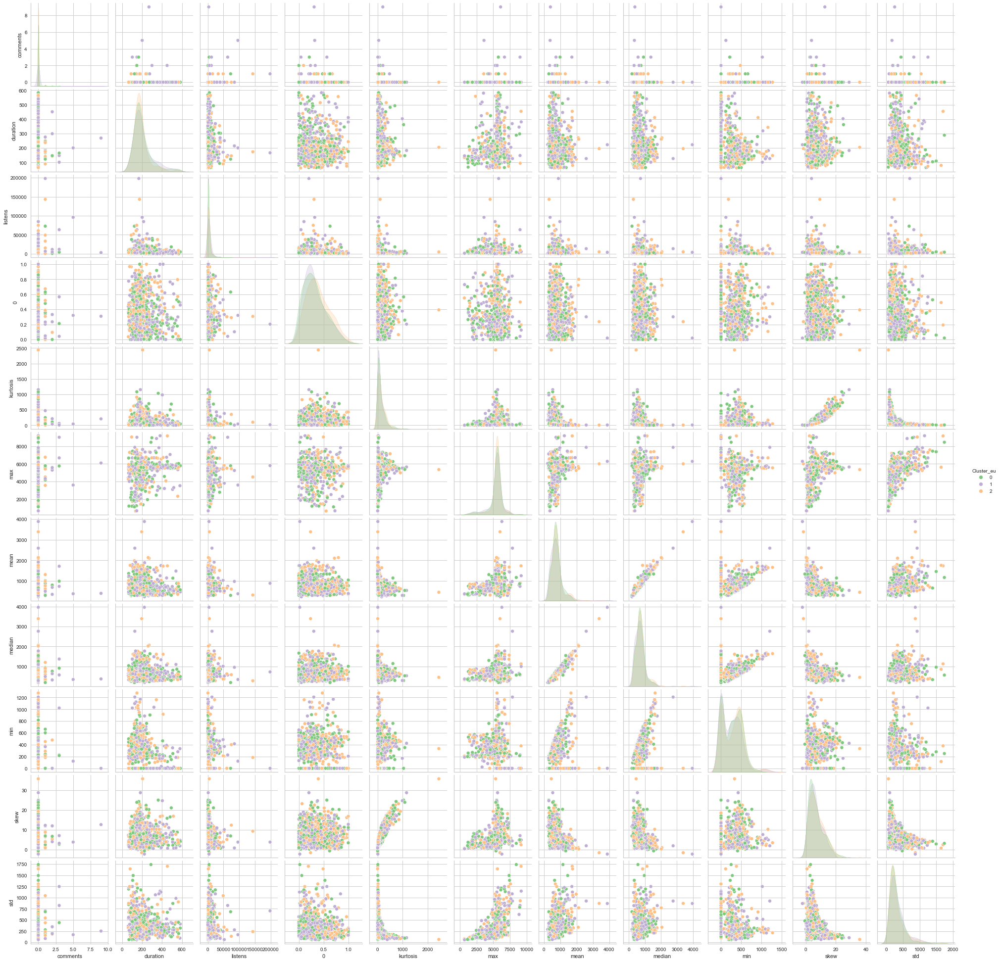

In [215]:
sns.pairplot(ts_df_eu, palette='Accent', hue='Cluster_eu')

## KMeans: DTW

In [ ]:
km_dtw=TimeSeriesKMeans(n_clusters=3, metric='dtw', n_init=10, max_iter=200, max_iter_barycenter=100, random_state=0)
km_dtw.fit(ts)

In [ ]:
plt.plot(np.squeeze(km_dtw.cluster_centers_[0], ).T, color='r')
plt.plot(np.squeeze(km_dtw.cluster_centers_[1],).T, color='b')
plt.plot(np.squeeze(km_dtw.cluster_centers_[2], ).T, color='g')
plt.show()
plt.figure(figsize=(6,30))
plt.show()

In [ ]:
#Observing the size of each cluster
np.unique(km_dtw.labels_, return_counts=True)

In [ ]:
ts_df_dtw=ts_df_dtws_df.copy()
ts_df_dtw["Cluster_dtw"] = km_dtw.labels_

In [ ]:
clas_0_dtw=ts_df_dtw[ts_df_dtw['genre_top']=='Classical'][ts_df_dtw['Cluster_dtw']==0].index
clas_1_dtw=ts_df_dtw[ts_df_dtw['genre_top']=='Classical'][ts_df_dtw['Cluster_dtw']==1].index
clas_2_dtw=ts_df_dtw[ts_df_dtw['genre_top']=='Classical'][ts_df_dtw['Cluster_dtw']==2].index
old_0_dtw=ts_df_dtw[ts_df_dtw['genre_top']=='Old-Time / Historic'][ts_df_dtw['Cluster_dtw']==0].index
old_1_dtw=ts_df_dtw[ts_df_dtw['genre_top']=='Old-Time / Historic'][ts_df_dtw['Cluster_dtw']==1].index
old_2_dtw=ts_df_dte[ts_df_dtw['genre_top']=='Old-Time / Historic'][ts_df_dtw['Cluster_dtw']==2].index

In [ ]:
print('Cluster 0: Classical:{}, Old-Time/Historic:{}, Total of:{}'.format(len(clas_0_dtw),len(old_0_dtw),len(clas_0_dtw)+len(old_0_dtw)))
print('Cluster 1: Classical:{}, Old-Time/Historic:{}, Total of {}'.format(len(clas_1_dtw),len(old_1_dtw),len(clas_1_dtw)+len(old_1_dtw)))
print('Cluster 2: Classical:{}, Old-Time/Historic:{}, Total of {}'.format(len(clas_2_dtw),len(old_2_dtw),len(clas_2_dtw)+len(old_2_dtw)))

In [ ]:
sns.pairplot(ts_df_eu, palette='Accent', hue='Cluster_dtw')
plt.show()

# Approximated Clustering

## PiecewiseAggregateApproximation

In [47]:
import ruptures as rpt
from tslearn.piecewise import PiecewiseAggregateApproximation
from tslearn.piecewise import SymbolicAggregateApproximation

In [48]:
n_paa_segments = 120
paa = PiecewiseAggregateApproximation(n_segments=n_paa_segments)
X_paa = paa.fit_transform(ts)

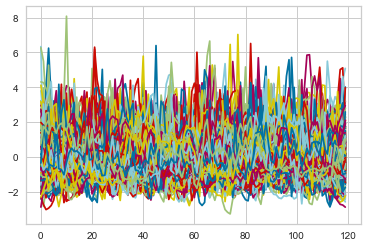

In [49]:
plt.plot(X_paa.T.reshape(X_paa.shape[1], X_paa.shape[0]))
plt.show()

## PAA: Euclidean

In [50]:
km_paa_eu = TimeSeriesKMeans(n_clusters=3, metric="euclidean",n_init=10, max_iter=200, random_state=0)
km_paa_eu.fit(X_paa)

TimeSeriesKMeans(max_iter=200, n_init=10, random_state=0)

In [51]:
km_paa_eu.cluster_centers_.shape

(3, 120, 1)

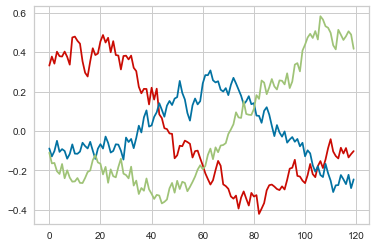

In [52]:
plt.plot(np.squeeze(km_paa_eu.cluster_centers_[0]).T, color='r')
plt.plot(np.squeeze(km_paa_eu.cluster_centers_[1]).T, color='b')
plt.plot(np.squeeze(km_paa_eu.cluster_centers_[2]).T, color='g')
plt.show()

In [53]:
#Observing the size of each cluster
np.unique(km_paa_eu.labels_, return_counts=True)

(array([0, 1, 2], dtype=int64), array([284, 445, 299], dtype=int64))

In [54]:
ts_df1=ts_df.copy()
ts_df1["Cluster__paa_eu"] = km_paa_eu.labels_

In [55]:
clas_0_paa_eu=ts_df1[ts_df1['genre_top']=='Classical'][ts_df1["Cluster__paa_eu"]==0].index
clas_1_paa_eu=ts_df1[ts_df1['genre_top']=='Classical'][ts_df1["Cluster__paa_eu"]==1].index
clas_2_paa_eu=ts_df1[ts_df1['genre_top']=='Classical'][ts_df1["Cluster__paa_eu"]==2].index
old_0_paa_eu=ts_df1[ts_df1['genre_top']=='Old-Time / Historic'][ts_df1["Cluster__paa_eu"]==0].index
old_1_paa_eu=ts_df1[ts_df1['genre_top']=='Old-Time / Historic'][ts_df1["Cluster__paa_eu"]==1].index
old_2_paa_eu=ts_df1[ts_df1['genre_top']=='Old-Time / Historic'][ts_df1["Cluster__paa_eu"]==2].index

In [56]:
print('Cluster 0: Classical:{},Old-Time/Historic:{}, Total of:{}'.format(len(clas_0_paa_eu),len(old_0_paa_eu),len(old_0_paa_eu)+len(clas_0_paa_eu)))
print('Cluster 1: Classical:{},Old-Time/Historic:{}, Total of:{}'.format(len(clas_1_paa_eu),len(old_1_paa_eu),len(old_1_paa_eu)+len(clas_1_paa_eu)))
print('Cluster 2: Classical:{},Old-Time/Historic:{}, Total of:{}'.format(len(clas_2_paa_eu),len(old_2_paa_eu),len(old_2_paa_eu)+len(clas_2_paa_eu)))

Cluster 0: Classical:138,Old-Time/Historic:146, Total of:284
Cluster 1: Classical:203,Old-Time/Historic:242, Total of:445
Cluster 2: Classical:185,Old-Time/Historic:114, Total of:299


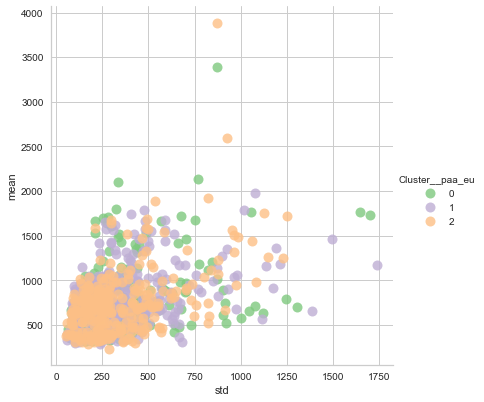

In [57]:
sns.lmplot(data=ts_df1,
                  y='mean',
                  x='std', hue='Cluster__paa_eu',markers=['o','o','o'],
                  size=5.5,
                  fit_reg =False,
                  palette='Accent',
                  scatter_kws={'s':100})
plt.show()

## PAA: DTW

In [58]:
km_paa_dtw = TimeSeriesKMeans(n_clusters=3,  metric='dtw', n_init=10, max_iter=200, max_iter_barycenter=100, random_state=0)
km_paa_dtw.fit(X_paa)

TimeSeriesKMeans(max_iter=200, metric='dtw', n_init=10, random_state=0)

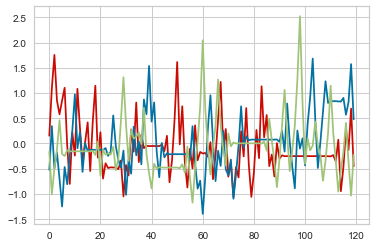

In [59]:
plt.plot(np.squeeze(km_paa_dtw.cluster_centers_[0]).T, color='r')
plt.plot(np.squeeze(km_paa_dtw.cluster_centers_[1]).T, color='b')
plt.plot(np.squeeze(km_paa_dtw.cluster_centers_[2]).T, color='g')
plt.show()

In [60]:
#Observing the size of each cluster
np.unique(km_paa_dtw.labels_, return_counts=True)

(array([0, 1, 2], dtype=int64), array([389, 248, 391], dtype=int64))

In [61]:
ts_df2=ts_df.copy()
ts_df2["Cluster__paa_dtw"] = km_paa_dtw.labels_

In [62]:
clas_0_paa_dtw=ts_df2[ts_df2['genre_top']=='Classical'][ts_df2["Cluster__paa_dtw"]==0].index
clas_1_paa_dtw=ts_df2[ts_df2['genre_top']=='Classical'][ts_df2["Cluster__paa_dtw"]==1].index
clas_2_paa_dtw=ts_df2[ts_df2['genre_top']=='Classical'][ts_df2["Cluster__paa_dtw"]==2].index
old_0_paa_dtw=ts_df2[ts_df2['genre_top']=='Old-Time / Historic'][ts_df2["Cluster__paa_dtw"]==0].index
old_1_paa_dtw=ts_df2[ts_df2['genre_top']=='Old-Time / Historic'][ts_df2["Cluster__paa_dtw"]==1].index
old_2_paa_dtw=ts_df2[ts_df2['genre_top']=='Old-Time / Historic'][ts_df2["Cluster__paa_dtw"]==2].index

In [63]:
print('Cluster 0: Classical:{},Old-Time/Historic:{}, Total of:{}'.format(len(clas_0_paa_dtw),len(old_0_paa_dtw),len(old_0_paa_dtw)+len(clas_0_paa_dtw)))
print('Cluster 1: Classical:{},Old-Time/Historic:{}, Total of:{}'.format(len(clas_1_paa_dtw),len(old_1_paa_dtw),len(old_1_paa_dtw)+len(clas_1_paa_dtw)))
print('Cluster 2: Classical:{},Old-Time/Historic:{}, Total of:{}'.format(len(clas_2_paa_dtw),len(old_2_paa_dtw),len(old_2_paa_dtw)+len(clas_2_paa_dtw)))

Cluster 0: Classical:143,Old-Time/Historic:246, Total of:389
Cluster 1: Classical:149,Old-Time/Historic:99, Total of:248
Cluster 2: Classical:234,Old-Time/Historic:157, Total of:391


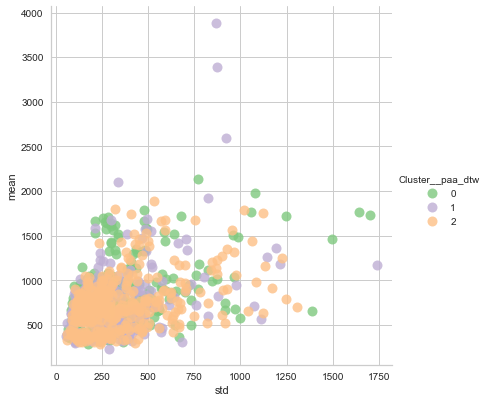

In [64]:
sns.lmplot(data=ts_df2,
                  y='mean',
                  x='std', hue='Cluster__paa_dtw',markers=['o','o','o'],
                  size=5.5,
                  fit_reg =False,
                  palette='Accent',
                  scatter_kws={'s':100})
plt.show()

## SAX: Euclidean

In [65]:
n_sax_symbols = 8
sax = SymbolicAggregateApproximation(n_segments=n_paa_segments, alphabet_size_avg=n_sax_symbols)
X_sax = sax.fit_transform(ts)

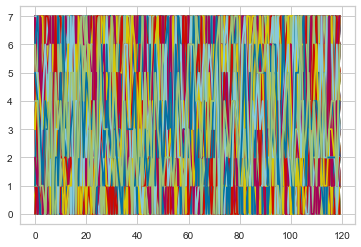

In [66]:
plt.plot(X_sax.reshape(X_sax.shape[1], X_sax.shape[0]))
plt.show()

In [67]:
km_sax = TimeSeriesKMeans(n_clusters=3, metric="euclidean",n_init=10, max_iter=200, random_state=0)
km_sax.fit(X_sax)

TimeSeriesKMeans(max_iter=200, n_init=10, random_state=0)

array([[[4.05033557],
        [4.11409396],
        [4.16107383],
        [4.12080537],
        [4.08724832],
        [4.20805369],
        [4.24161074],
        [4.22818792],
        [4.11073826],
        [4.44630872],
        [4.40268456],
        [4.38926174],
        [4.44630872],
        [4.12080537],
        [4.08053691],
        [4.10067114],
        [4.30201342],
        [4.40604027],
        [4.4261745 ],
        [4.45637584],
        [4.52013423],
        [4.53691275],
        [4.56040268],
        [4.55369128],
        [4.56040268],
        [4.61073826],
        [4.41275168],
        [4.37919463],
        [4.18456376],
        [4.16778523],
        [4.24832215],
        [4.24161074],
        [4.33557047],
        [4.15771812],
        [4.18120805],
        [3.9261745 ],
        [3.96979866],
        [3.97315436],
        [3.95302013],
        [3.72483221],
        [3.86241611],
        [3.74832215],
        [3.86241611],
        [3.61409396],
        [3.58389262],
        [3

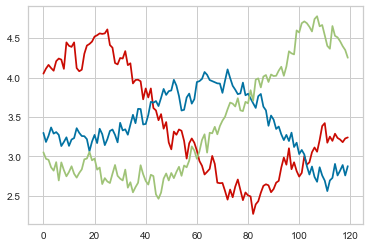

In [68]:
plt.plot(np.squeeze(km_sax.cluster_centers_[0]).T, color='r')
plt.plot(np.squeeze(km_sax.cluster_centers_[1]).T, color='b')
plt.plot(np.squeeze(km_sax.cluster_centers_[2]).T, color='g')
plt.show()

In [69]:
#Observing the size of each cluster
np.unique(km_sax.labels_, return_counts=True)

(array([0, 1, 2], dtype=int64), array([298, 424, 306], dtype=int64))

In [70]:
ts_df3=ts_df.copy()
ts_df3["Cluster__sax_eu"] = km_sax.labels_

In [71]:
clas_0_sax_eu=ts_df3[ts_df3['genre_top']=='Classical'][ts_df3["Cluster__sax_eu"]==0].index
clas_1_sax_eu=ts_df3[ts_df3['genre_top']=='Classical'][ts_df3["Cluster__sax_eu"]==1].index
clas_2_sax_eu=ts_df3[ts_df3['genre_top']=='Classical'][ts_df3["Cluster__sax_eu"]==2].index
old_0_sax_eu=ts_df3[ts_df3['genre_top']=='Old-Time / Historic'][ts_df3["Cluster__sax_eu"]==0].index
old_1_sax_eu=ts_df3[ts_df3['genre_top']=='Old-Time / Historic'][ts_df3["Cluster__sax_eu"]==1].index
old_2_sax_eu=ts_df3[ts_df3['genre_top']=='Old-Time / Historic'][ts_df3["Cluster__sax_eu"]==2].index

In [72]:
print('Cluster 0: Classical:{},Old-Time/Historic:{}, Total of:{}'.format(len(clas_0_sax_eu),len(old_0_sax_eu),len(old_0_sax_eu)+len(clas_0_sax_eu)))
print('Cluster 1: Classical:{},Old-Time/Historic:{}, Total of:{}'.format(len(clas_1_sax_eu),len(old_1_sax_eu),len(old_1_sax_eu)+len(clas_1_sax_eu)))
print('Cluster 2: Classical:{},Old-Time/Historic:{}, Total of:{}'.format(len(clas_2_sax_eu),len(old_2_sax_eu),len(old_2_sax_eu)+len(clas_2_sax_eu)))

Cluster 0: Classical:142,Old-Time/Historic:156, Total of:298
Cluster 1: Classical:188,Old-Time/Historic:236, Total of:424
Cluster 2: Classical:196,Old-Time/Historic:110, Total of:306


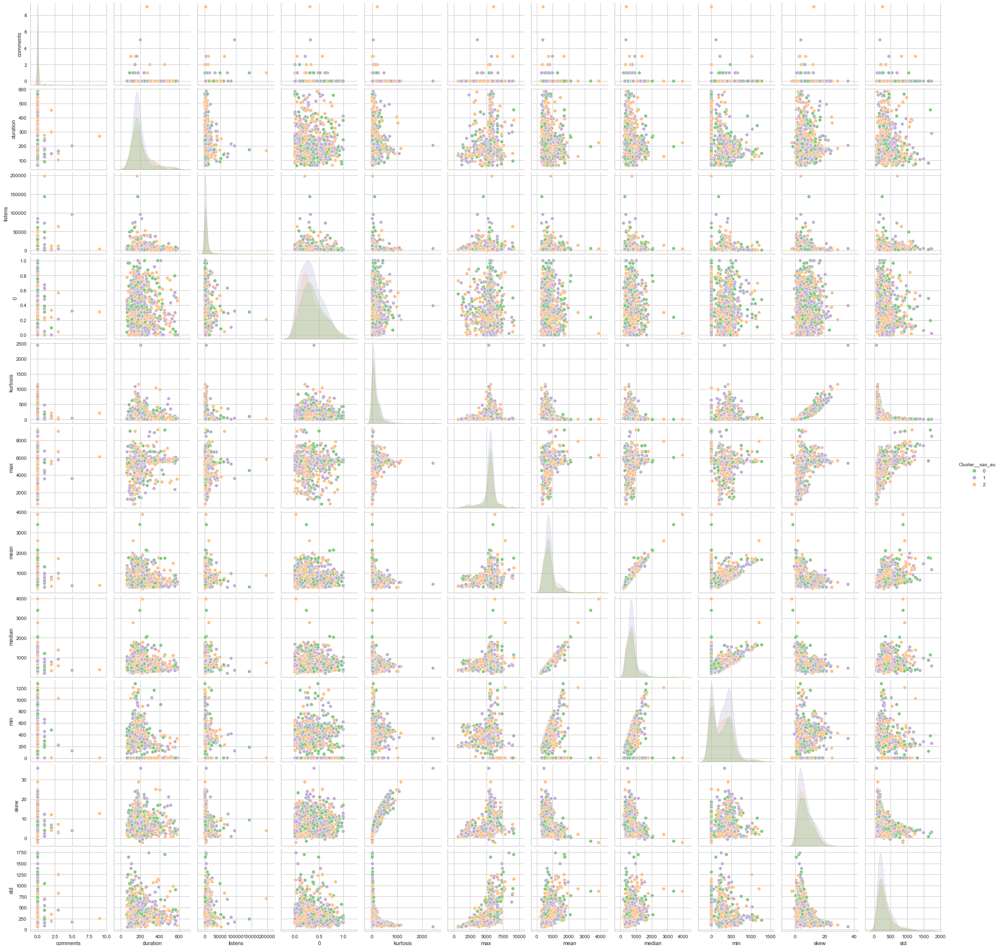

In [125]:
sns.pairplot(ts_df3, palette='Accent', hue='Cluster__sax_eu')

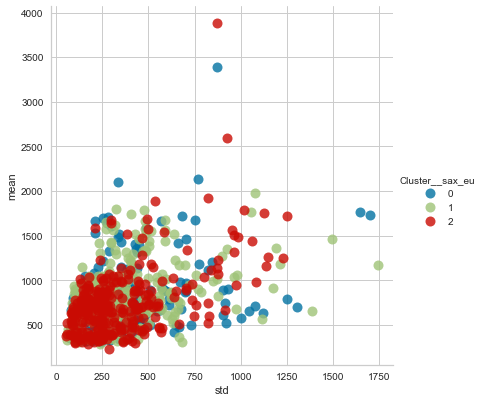

In [73]:
palette ={0: "C0", 1: "C1", 2: "C2"}
sns.lmplot(data=ts_df3,
                  y='mean',
                  x='std', hue='Cluster__sax_eu',markers=['o','o','o'],
                  size=5.5,
                  fit_reg =False,
                  palette=palette,
                  scatter_kws={'s':100})
plt.show()

## SAX: DTW

In [74]:
km_sax_dtw = TimeSeriesKMeans(n_clusters=3, metric='dtw', n_init=10, max_iter=200, max_iter_barycenter=100, random_state=0)
km_sax_dtw.fit(X_sax)

TimeSeriesKMeans(max_iter=200, metric='dtw', n_init=10, random_state=0)

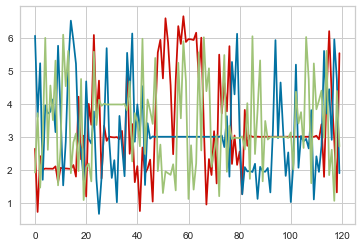

In [75]:
plt.plot(np.squeeze(km_sax_dtw.cluster_centers_[0]).T, color='r')
plt.plot(np.squeeze(km_sax_dtw.cluster_centers_[1]).T, color='b')
plt.plot(np.squeeze(km_sax_dtw.cluster_centers_[2]).T, color='g')
plt.show()

In [76]:
#Observing the size of each cluster
np.unique(km_sax_dtw.labels_, return_counts=True)

(array([0, 1, 2], dtype=int64), array([298, 391, 339], dtype=int64))

In [77]:
ts_df4=ts_df.copy()
ts_df4["Cluster__sax_dtw"] = km_sax_dtw.labels_

In [78]:
clas_0_sax_dtw=ts_df4[ts_df4['genre_top']=='Classical'][ts_df4["Cluster__sax_dtw"]==0].index
clas_1_sax_dtw=ts_df4[ts_df4['genre_top']=='Classical'][ts_df4["Cluster__sax_dtw"]==1].index
clas_2_sax_dtw=ts_df4[ts_df4['genre_top']=='Classical'][ts_df4["Cluster__sax_dtw"]==2].index
old_0_sax_dtw=ts_df4[ts_df4['genre_top']=='Old-Time / Historic'][ts_df4["Cluster__sax_dtw"]==0].index
old_1_sax_dtw=ts_df4[ts_df4['genre_top']=='Old-Time / Historic'][ts_df4["Cluster__sax_dtw"]==1].index
old_2_sax_dtw=ts_df4[ts_df4['genre_top']=='Old-Time / Historic'][ts_df4["Cluster__sax_dtw"]==2].index

In [79]:
print('Cluster 0: Classical:{},Old-Time/Historic:{}, Total of:{}'.format(len(clas_0_sax_dtw),len(old_0_sax_dtw),len(old_0_sax_dtw)+len(clas_0_sax_dtw)))
print('Cluster 1: Classical:{},Old-Time/Historic:{}, Total of:{}'.format(len(clas_1_sax_dtw),len(old_1_sax_dtw),len(old_1_sax_dtw)+len(clas_1_sax_dtw)))
print('Cluster 2: Classical:{},Old-Time/Historic:{}, Total of:{}'.format(len(clas_2_sax_dtw),len(old_2_sax_dtw),len(old_2_sax_dtw)+len(clas_2_sax_dtw)))

Cluster 0: Classical:226,Old-Time/Historic:72, Total of:298
Cluster 1: Classical:214,Old-Time/Historic:177, Total of:391
Cluster 2: Classical:86,Old-Time/Historic:253, Total of:339


[]

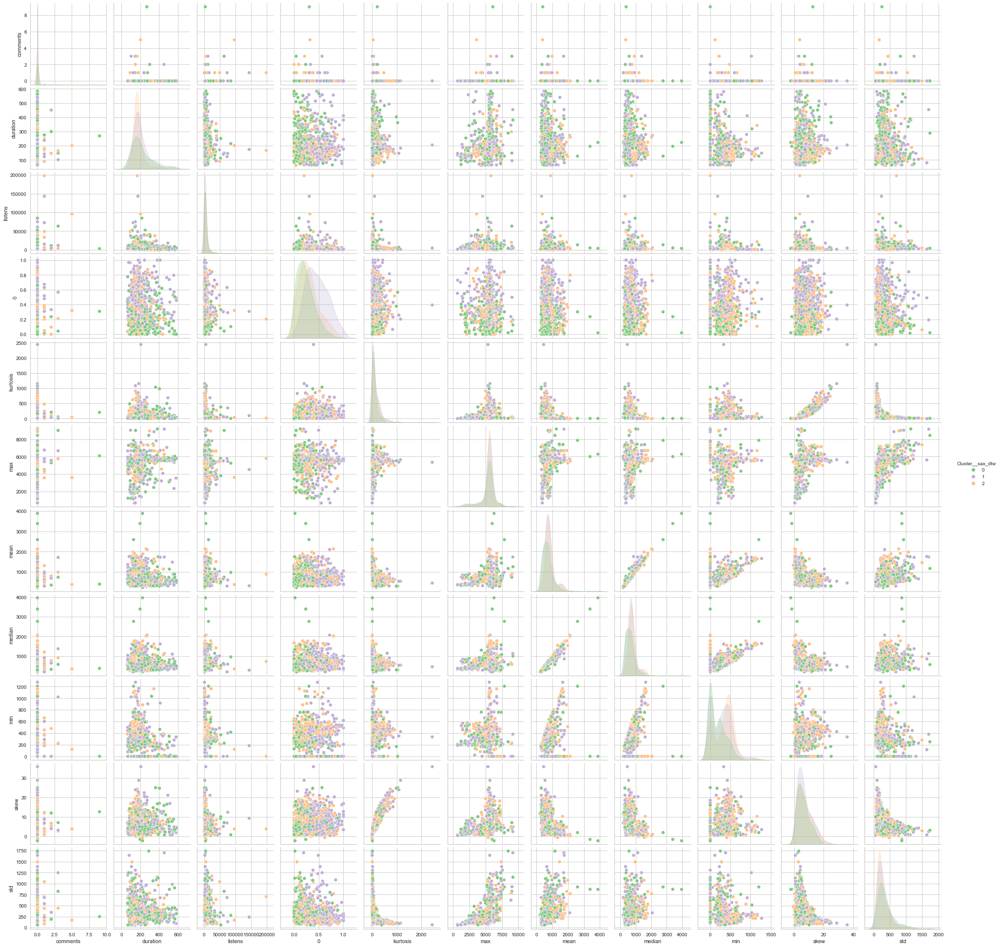

In [80]:
sns.pairplot(ts_df4, hue='Cluster__sax_dtw', palette='Accent')
plt.plot()

# Hierarchical: Euclidean

In [81]:
from scipy.stats import mode
from scipy.spatial.distance import pdist
from scipy.cluster.hierarchy import linkage, dendrogram, fcluster
from sklearn.cluster import AgglomerativeClustering
from sklearn.neighbors import kneighbors_graph
from tslearn.metrics import dtw as dtw
from matplotlib import pyplot as plt

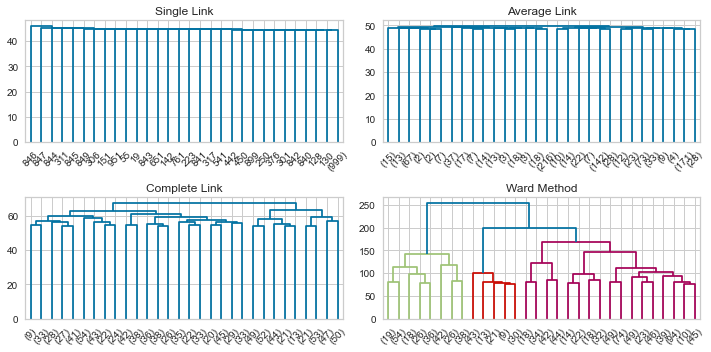

In [82]:
plt.figure( figsize=(10,5))

plt.subplot(2,2, 1)
data_dist = pdist(ts, metric='euclidean')
data_link = linkage(data_dist, method='single', metric='euclidean')
res = dendrogram(data_link, truncate_mode='lastp')
plt.title('Single Link')

plt.subplot(2, 2, 2)
data_dist = pdist(ts, metric='euclidean')
data_link = linkage(data_dist, method='average', metric='euclidean')
res = dendrogram(data_link, truncate_mode='lastp')
plt.title('Average Link')

plt.subplot(2,2, 3)
data_dist = pdist(ts, metric='euclidean')
data_link = linkage(data_dist, method='complete', metric='euclidean')
res = dendrogram(data_link, truncate_mode='lastp')
plt.title('Complete Link')

plt.subplot(2, 2, 4)
data_dist = pdist(ts, metric='euclidean')
data_link = linkage(data_dist, method='ward', metric='euclidean')
res = dendrogram(data_link, truncate_mode='lastp')
plt.title('Ward Method')

plt.tight_layout()
plt.show()

Text(0.5, 1.0, 'Ward')

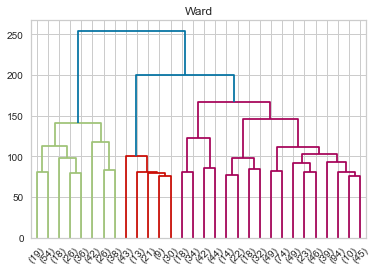

In [83]:
#ward link
data_dist = pdist(ts, metric='euclidean')
data_link = linkage(data_dist, method='ward', metric='euclidean')
res = dendrogram(data_link, truncate_mode='lastp')
plt.title('Ward')

In [84]:
ts_df.iloc[9]

comments                       0
duration                     258
genre_top    Old-Time / Historic
listens                     1019
0                            0.0
kurtosis               13.331332
max                  5502.308106
mean                 1154.982056
median                1056.62793
min                          0.0
skew                    2.676594
std                    351.40979
Name: 5018, dtype: object

In [85]:
ward = AgglomerativeClustering(n_clusters=3, linkage='ward', affinity='euclidean')
ward.fit_predict(ts)

array([1, 0, 0, ..., 1, 0, 0], dtype=int64)

In [86]:
ts_df_hier=ts_df.copy()
ts_df_hier['Cluster']=ward.labels_

In [87]:
clas_0_h=ts_df_hier[ts_df_hier['genre_top']=='Classical'][ts_df_hier["Cluster"]==0].index
clas_1_h=ts_df_hier[ts_df_hier['genre_top']=='Classical'][ts_df_hier["Cluster"]==1].index
clas_2_h=ts_df_hier[ts_df_hier['genre_top']=='Classical'][ts_df_hier["Cluster"]==2].index
old_0_h=ts_df_hier[ts_df_hier['genre_top']=='Old-Time / Historic'][ts_df_hier["Cluster"]==0].index
old_1_h=ts_df_hier[ts_df_hier['genre_top']=='Old-Time / Historic'][ts_df_hier["Cluster"]==1].index
old_2_h=ts_df_hier[ts_df_hier['genre_top']=='Old-Time / Historic'][ts_df_hier["Cluster"]==2].index

In [88]:
print('Cluster 0: Classical:{},Old-Time/Historic:{}, Total of:{}'.format(len(clas_0_h),len(old_0_h),len(old_0_h)+len(clas_0_h)))
print('Cluster 1: Classical:{},Old-Time/Historic:{}, Total of:{}'.format(len(clas_1_h),len(old_1_h),len(old_1_h)+len(clas_1_h)))
print('Cluster 2: Classical:{},Old-Time/Historic:{}, Total of:{}'.format(len(clas_2_h),len(old_2_h),len(old_2_h)+len(clas_2_h)))

Cluster 0: Classical:285,Old-Time/Historic:368, Total of:653
Cluster 1: Classical:167,Old-Time/Historic:92, Total of:259
Cluster 2: Classical:74,Old-Time/Historic:42, Total of:116


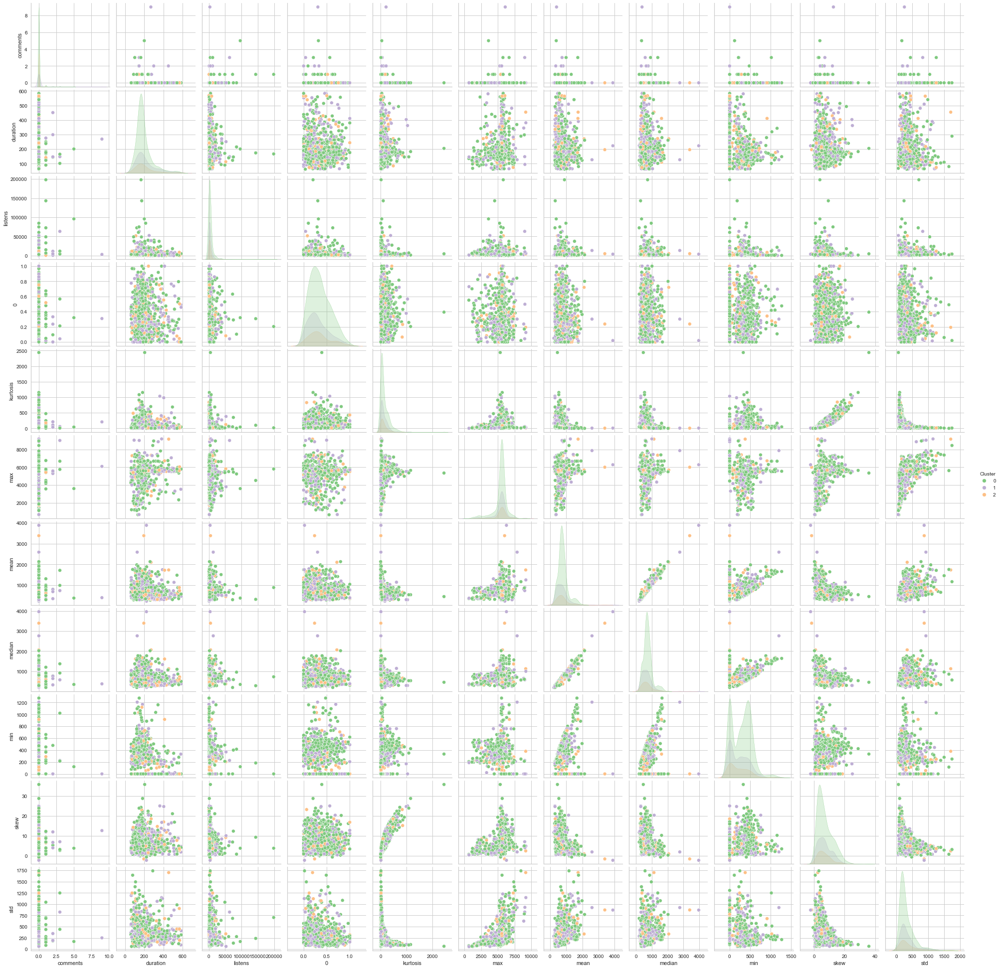

In [89]:
sns.pairplot(ts_df_hier, hue='Cluster', palette='Accent')
plt.show()

In [90]:
#wards method _ silhouette scores
k_to_test = range(2,10,1) # [2,3,4, ..., 24]
silhouette_scores_w = {}

for k in k_to_test:
    ward_linkage = AgglomerativeClustering(n_clusters=k, linkage='ward', affinity='euclidean')
    
    ward_linkage.fit(ts)
    labels_kw = ward_linkage.labels_
    score_kw = silhouette_score(ts, ward_linkage.labels_)
    silhouette_scores_w[k] = score_kw
    
    print ('silhouette for k= {}: {}'.format(k,score_kw))
print('Done')

silhouette for k= 2: 0.024224235787977718
silhouette for k= 3: 0.010095688077622749
silhouette for k= 4: 0.010596940573566591
silhouette for k= 5: 0.010788236455009197
silhouette for k= 6: 0.005479764742136714
silhouette for k= 7: 0.001931266212164225
silhouette for k= 8: -0.001973524204321472
silhouette for k= 9: -0.0017534452037365345
Done


In [91]:
#convert dict values to a list 
sil_v = []
for i in silhouette_scores_w.values():
    sil_v.append(i)

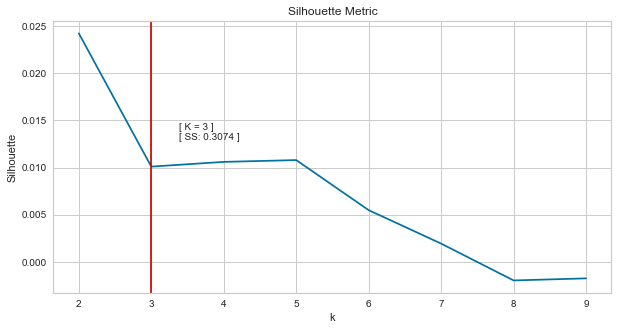

In [92]:
#Silhouette metric graph
plt.figure(figsize = (10,5))
plt.plot(sil_v)
plt.xticks(range(0,8,1), silhouette_scores_w.keys())
plt.title("Silhouette Metric")
plt.xlabel("k")
plt.ylabel("Silhouette")
plt.axvline(1, color = "r")
plt.figtext(0.3,0.55,'[ K = 3 ]\n[ SS: 0.3074 ] ')
plt.show()


## Hierarchical: DTW


In [93]:
import pandas as pd
import scipy.cluster.hierarchy as hac

In [97]:
dist=sklearn.metrics.pairwise.pairwise_distances(ts)

In [114]:
dtw_hier2 = AgglomerativeClustering(n_clusters=3, linkage='average', affinity='precomputed')
dtw_hier2.fit_predict(dist)
dist.shape

(1028, 1028)

In [119]:
dtw_hier2 = AgglomerativeClustering(n_clusters=3, linkage='complete', affinity='precomputed')
dtw_hier2.fit_predict(dist)
dist.shape

(1028, 1028)

In [109]:
dtw_hier2 = AgglomerativeClustering(n_clusters=3, linkage='single', affinity='precomputed')
dtw_hier2.fit_predict(dist)
dist.shape

(1028, 1028)

In [120]:
np.unique(dtw_hier2.labels_,)

array([0, 1, 2], dtype=int64)

In [121]:
ts_df_hier2=ts_df.copy()
ts_df_hier2['Cluster']=dtw_hier2.labels_

In [122]:
clas_0_h2=ts_df_hier2[ts_df_hier2['genre_top']=='Classical'][ts_df_hier2["Cluster"]==0].index
clas_1_h2=ts_df_hier2[ts_df_hier2['genre_top']=='Classical'][ts_df_hier2["Cluster"]==1].index
clas_2_h2=ts_df_hier2[ts_df_hier2['genre_top']=='Classical'][ts_df_hier2["Cluster"]==2].index
old_0_h2=ts_df_hier2[ts_df_hier2['genre_top']=='Old-Time / Historic'][ts_df_hier2["Cluster"]==0].index
old_1_h2=ts_df_hier2[ts_df_hier2['genre_top']=='Old-Time / Historic'][ts_df_hier2["Cluster"]==1].index
old_2_h2=ts_df_hier2[ts_df_hier2['genre_top']=='Old-Time / Historic'][ts_df_hier2["Cluster"]==2].index

In [123]:
print('Cluster 0: Classical:{},Old-Time/Historic:{}, Total of:{}'.format(len(clas_0_h2),len(old_0_h2),len(old_0_h2)+len(clas_0_h2)))
print('Cluster 1: Classical:{},Old-Time/Historic:{}, Total of:{}'.format(len(clas_1_h2),len(old_1_h2),len(old_1_h2)+len(clas_1_h2)))
print('Cluster 2: Classical:{},Old-Time/Historic:{}, Total of:{}'.format(len(clas_2_h2),len(old_2_h2),len(old_2_h2)+len(clas_2_h2)))

Cluster 0: Classical:334,Old-Time/Historic:344, Total of:678
Cluster 1: Classical:100,Old-Time/Historic:71, Total of:171
Cluster 2: Classical:92,Old-Time/Historic:87, Total of:179


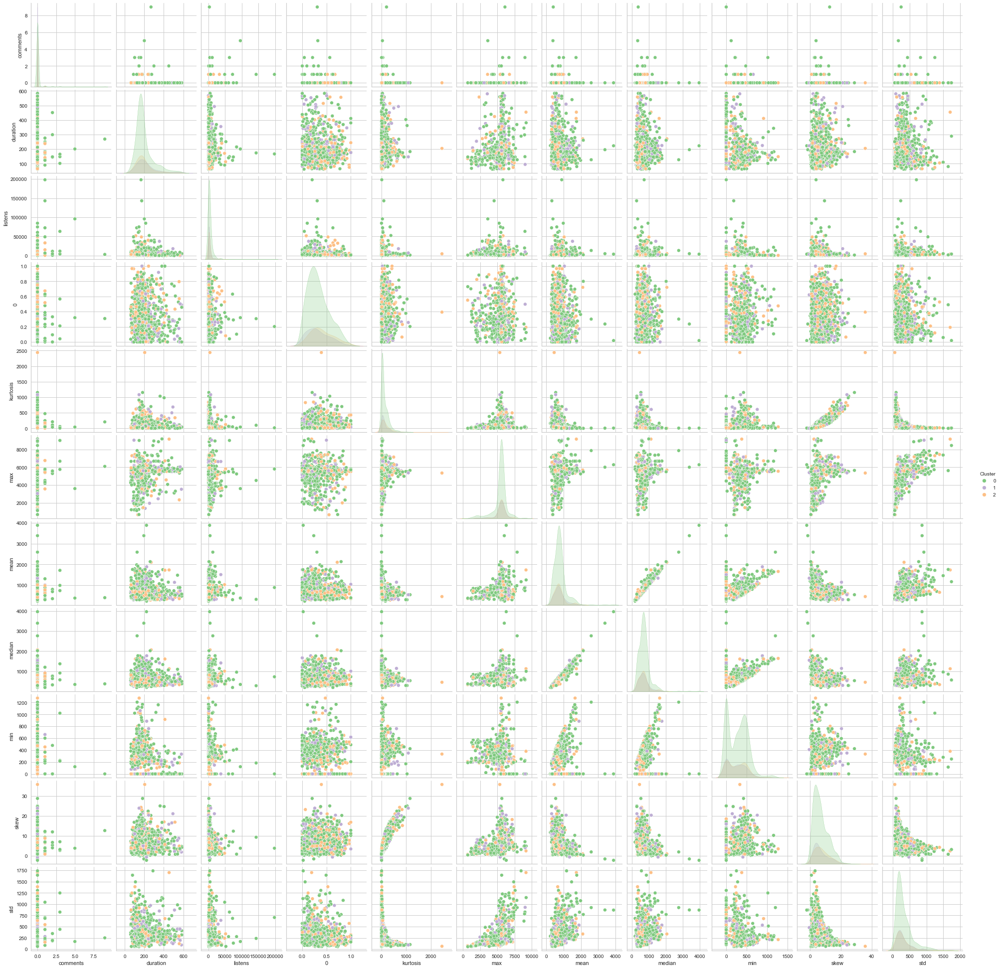

In [124]:
sns.pairplot(ts_df_hier2, hue='Cluster', palette='Accent')
plt.show()